# Wstęp i cel projektu

Celem projektu jest analiza wyników jednej z strategii tradingowej z wykorzystaniem metod redukcji wymiaru i wizualizacji zależności pomiędzy konfiguracjami parametrów strategii. Zastosowane zostaną dwie techniki:
- skalowanie wielowymiarowe (MDS)
- analiza składowych głównych (PCA).

Zebrane dane pochodzą z serii testów strategii tradingowej, w których zmieniane były kluczowe parametry mające wpływ na wyniki metryk, są to:


Dla każdej konfiguracji wyznaczono podstawowe metryki używane w świecie tradingu, między innymi współczynnik Sharpe’a, wskaźnik Sortino, maksymalne obsunięcie kapitału (Max Drawdown), współczynnik Profit Factor oraz całkowity zwrot z inwestycji (Total Return) oraz inne.

Analiza ma na celu określenie, jakie zależności występują pomiędzy wynikami strategii, które z metryk niosą podobną informację oraz czy możliwe jest wyodrębnienie ogólnych czynników opisujących skuteczność strategii, takich jak zyskowność czy ryzyko. Dodatkowo, poprzez połączenie wyników PCA z informacjami o parametrach strategii, celem jest identyfikacja obszarów ustawień, które prowadzą do stabilnych i powtarzalnych rezultatów.

W części pracy odnoszącej się do MDS wykorzystane zostaną dwie metody skalowania wielowymiarowego:
- klasyczne skalowanie metryczne
- nieliniowa metoda Sammona.
Pozwoli to na wizualne przedstawienie podobieństw pomiędzy konfiguracjami strategii i porównanie uzyskanych rzutowań z wynikami PCA.

Ostatecznym celem analizy jest lepsze zrozumienie struktury wyników strategii i znalezienie powiązań pomiędzy parametrami a efektywnością, co może stanowić podstawę do dalszej optymalizacji strategii w praktycznym zastosowaniu.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor

# pokazywanie wszystkich kolumn i wierszy
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option("display.width", 400)
pd.set_option("display.colheader_justify", "center")
np.set_printoptions(threshold=np.inf)

df = pd.read_parquet("result.parquet")

# Wczytanie danych
df = pd.read_parquet("result.parquet")
print(f"Liczba obserwacji: {df.shape[0]}")
print(f"Liczba kolumn: {df.shape[1]}")

# Przykładowe dane
df.head()

Liczba obserwacji: 17979
Liczba kolumn: 34


,win_rate,total_trades,sharpe_ratio,sortino_ratio,total_return,max_dd,annualized_return,annualized_volatility,alpha,beta,calmar_ratio,omega_ratio,tail_ratio,value_at_risk,trades_profit_factor,dd_avg_drawdown,size_big,size_small,rr,sl_pct,s1_ttl,rsi_bsp_period,rsi_bsp_ewm,rsi_bsp_os_zone,rsi_bsp_ob_zone,stoch_k,stoch_d,stoch_ema,stoch_smooth,stoch_os_zone,stoch_ob_zone,adx_period,adx_smoothing,adx_threshold
0,0.330000,200,0.289618,0.409098,0.052078,-0.171171,0.028918,0.125719,-0.005059,0.086984,0.168941,1.002646,0.996335,-0.000178,1.043581,-0.005219,1.0,0.7,2.4,0.011,5,16,False,24,75,14,12,5,10,-77.0,76.0,50,11,45
1,0.287500,320,-0.232172,-0.327642,-0.165758,-0.534495,-0.096761,0.275213,-0.186173,0.297991,-0.181033,0.998595,1.010073,-0.000532,0.942578,-0.007756,1.0,0.3,2.6,0.013,5,12,True,24,75,14,6,5,12,-79.0,76.0,20,19,5
2,0.231707,328,0.152851,0.216717,0.015188,-0.401790,0.008501,0.233072,-0.064024,0.213445,0.021157,1.001030,1.007786,-0.000435,1.006053,-0.005562,1.0,0.0,3.8,0.009,5,8,True,26,75,16,16,5,10,-75.0,76.0,50,8,5
3,0.283388,307,-0.462367,-0.653283,-0.214476,-0.312752,-0.126771,0.233980,-0.190816,0.217121,-0.405341,0.996941,1.004040,-0.000443,0.907701,-0.006329,1.0,0.7,2.6,0.011,5,6,True,28,75,20,16,5,12,-77.0,76.0,5,11,35
4,0.227533,523,-0.852946,-1.202969,-0.319915,-0.429134,-0.194663,0.224321,-0.267375,0.251181,-0.453618,0.995056,1.000851,-0.000433,0.876699,-0.006998,1.0,0.7,3.4,0.009,5,8,True,24,75,20,14,5,6,-77.0,76.0,140,19,15


In [27]:
# Przygotowanie odpowiednich danych i kolumn do analizy. Podział na parametry i metryki.

# Nazwy kolumn, które trzymają wartości parametrów strategii
parameters_column_names = [
    "size_big",
    "size_small",
    "rr",
    "sl_pct",
    "rsi_bsp_period",
    "rsi_bsp_ewm",
    "rsi_bsp_os_zone",
    "stoch_k",
    "stoch_d",
    "stoch_smooth",
    "stoch_os_zone",
    "adx_period",
    "adx_smoothing",
    "adx_threshold",
]

# Nazwy kolumn, które trzymają wartości parametrów strategii ale nie są używane (ponieważ te wyniki są tylko dla modelu long only, czyli kupujacej i grającej na wzrosty bez grania na spadki. Dlatego usuwam parametry które były używane przez strategię short only)
parameters_column_names_to_remove = [
    "size_big", # stała 1.0
    "s1_ttl",
    "rsi_bsp_ob_zone",
    "stoch_ema",
    "stoch_ob_zone"
]

# Zbiór kolumn parametrów, które trzeba wykluczyć, żeby wyodrębnić metryki
excluded_params = set(parameters_column_names + parameters_column_names_to_remove)

# Kolumny metryk = wszystkie kolumny poza wykluczonymi
metric_columns = [col for col in df.columns if col not in excluded_params]

all_columns = set(parameters_column_names + metric_columns)

df_params = df[parameters_column_names]
df_metrics = df[metric_columns]

print(f"Liczba kolumn parametrów: {len(parameters_column_names)}")
print(f"Liczba kolumn metryk: {len(metric_columns)}")


Liczba kolumn parametrów: 14
Liczba kolumn metryk: 15


In [ ]:
print("\nStatystyki parametrów")
display(df_params.describe().T.round(3))

print("\nStatystyki metryk")
display(df_metrics.describe().T.round(3))


Statystyki parametrów ---


,count,mean,std,min,25%,50%,75%,max
size_big,7685.0,1.000,0.000,1.000,1.000,1.000,1.000,1.000
size_small,7685.0,0.490,0.325,0.000,0.300,0.300,0.700,1.000
rr,7685.0,3.627,0.688,1.600,3.200,3.800,4.200,4.400
sl_pct,7685.0,0.011,0.002,0.007,0.009,0.011,0.013,0.015
rsi_bsp_period,7685.0,11.977,3.280,6.000,10.000,14.000,14.000,18.000
rsi_bsp_os_zone,7685.0,25.578,2.323,22.000,24.000,26.000,28.000,30.000
stoch_k,7685.0,9.996,3.031,6.000,8.000,10.000,12.000,20.000
stoch_d,7685.0,10.809,3.595,6.000,8.000,10.000,14.000,20.000
stoch_smooth,7685.0,10.687,2.048,6.000,10.000,10.000,12.000,14.000
stoch_os_zone,7685.0,-76.277,2.258,-79.000,-79.000,-77.000,-75.000,-71.000



Statystyki metryk


/Users/anteqkois/venvs/myenv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


,count,mean,std,min,25%,50%,75%,max
win_rate,7685.0,0.273,0.049,0.170,0.241,0.262,0.291,0.552
total_trades,7685.0,173.467,102.275,21.000,96.000,167.000,235.000,841.000
sharpe_ratio,7685.0,0.718,0.532,0.000,0.283,0.608,1.047,2.796
sortino_ratio,7685.0,1.024,0.765,0.000,0.402,0.864,1.495,4.093
total_return,7685.0,0.191,0.194,-0.078,0.047,0.132,0.282,1.075
max_dd,7685.0,-0.158,0.074,-0.350,-0.204,-0.145,-0.102,-0.015
annualized_return,7685.0,0.100,0.097,-0.045,0.026,0.072,0.150,0.507
annualized_volatility,7685.0,0.152,0.063,0.017,0.103,0.149,0.197,0.414
alpha,7685.0,0.052,0.092,-0.181,-0.008,0.033,0.102,0.425
beta,7685.0,0.121,0.082,0.004,0.058,0.106,0.165,0.676


Możemy zauważyć iż:
- 

In [ ]:
# Określamy istotność parametrów strategii, by nie pokazywać wszytskiego naraz na późniejszych wykresachm gdyż jest tego poprostu dużo
X = df[parameters_column_names]

model = RandomForestRegressor(n_estimators=200, random_state=42)
model.fit(X, df['sharpe_ratio'])

importances = pd.Series(model.feature_importances_, index=parameters_column_names)
top_params = importances.sort_values(ascending=False)

print("Wpływow parametrów na postawie sharpe_ratio:")
print(top_params)

model.fit(X, df['total_return'])

importances = pd.Series(model.feature_importances_, index=parameters_column_names)
top_params = importances.sort_values(ascending=False)

print("Wpływow parametrów na postawie total_return:")
print(top_params)

Wpływow parametrów na postawie sharpe_ratio:
rr                 0.250350
sl_pct             0.127480
rsi_bsp_period     0.112712
stoch_k            0.076933
stoch_d            0.071941
adx_period         0.054357
stoch_os_zone      0.052627
stoch_smooth       0.051943
rsi_bsp_os_zone    0.050191
rsi_bsp_ewm        0.042517
adx_threshold      0.042404
adx_smoothing      0.034187
size_small         0.032359
size_big           0.000000
dtype: float64
Wpływow parametrów na postawie total_return:
rr                 0.234042
stoch_d            0.096573
sl_pct             0.087819
rsi_bsp_period     0.084040
size_small         0.072797
stoch_k            0.071124
adx_threshold      0.065215
stoch_smooth       0.058497
rsi_bsp_ewm        0.055778
stoch_os_zone      0.055241
adx_period         0.046997
rsi_bsp_os_zone    0.042636
adx_smoothing      0.029240
size_big           0.000000
dtype: float64


In [39]:
# Na tej podstawie, jako ważne parametry wybieramy
important_parameters_column_names = [
    "rr",
    "sl_pct",
    "size_small",
    "rsi_bsp_period",
    "stoch_k",
    "stoch_d",
    "stoch_smooth",
    "stoch_os_zone",
    "adx_threshold",
]

In [ ]:
# Zamiana inf/-inf na NaN (dla diagnostyki)
df_check = df.copy()
df_check.replace([np.inf, -np.inf], np.nan, inplace=True)

# Znalezienie kolumn z brakami
cols_with_missing = df_check.columns[df_check.isna().any()].tolist()
print(f"Znaleziono {len(cols_with_missing)} kolumn z brakami:")
print(cols_with_missing)

# Dla każdej kolumny z brakami pokazujemy szczegóły
for col in cols_with_missing:
    n_missing = df_check[col].isna().sum()
    print(f"\nkolumna: {col}")
    print(f"Liczba braków: {n_missing}")
    print("Przykładowe wiersze z brakami:")
    rows_for_missing = df_check.loc[df_check[col].isna()]
    display(rows_for_missing[[col, "total_trades", "total_return", "sharpe_ratio", "sortino_ratio"]].head(10))
    print("Statystyki wierszy z brakami:")
    display(rows_for_missing[metric_columns].describe().T.round(3))
    # display(rows_with_missing[metric_columns].describe().T.round(3))

Znaleziono 1 kolumn z brakami:
['tail_ratio']

kolumna: tail_ratio
Liczba braków: 800
Przykładowe wiersze z brakami:


,tail_ratio,total_trades,total_return,sharpe_ratio,sortino_ratio
65,NaN,33,0.122763,0.652670,0.928904
71,NaN,29,0.024403,0.252405,0.364599
78,NaN,64,0.034783,0.292405,0.414783
104,NaN,24,0.098758,0.725997,1.042511
135,NaN,37,0.028143,0.217050,0.306191
162,NaN,38,0.010123,0.112380,0.160204
169,NaN,42,0.025428,0.216794,0.306786
175,NaN,81,0.097346,0.612330,0.869507
189,NaN,67,0.046832,0.417871,0.589487
202,NaN,23,0.032409,0.324465,0.468155


Statystyki wierszy z brakami:


,count,mean,std,min,25%,50%,75%,max
win_rate,800.0,0.333,0.074,0.170,0.278,0.324,0.379,0.552
total_trades,800.0,38.898,19.861,21.000,25.000,33.000,45.000,168.000
sharpe_ratio,800.0,0.576,0.426,0.000,0.245,0.505,0.856,2.256
sortino_ratio,800.0,0.825,0.617,0.000,0.347,0.720,1.226,3.341
total_return,800.0,0.082,0.076,-0.009,0.025,0.063,0.113,0.484
max_dd,800.0,-0.089,0.030,-0.208,-0.111,-0.087,-0.069,-0.015
annualized_return,800.0,0.044,0.040,-0.005,0.014,0.035,0.062,0.248
annualized_volatility,800.0,0.078,0.021,0.017,0.065,0.080,0.094,0.130
alpha,800.0,0.035,0.039,-0.022,0.006,0.026,0.052,0.229
beta,800.0,0.027,0.012,0.004,0.017,0.026,0.035,0.066


***1) wcześniejsza wersja MDS i PCA była tworzona na podstawie wszytskich wyników. Jednak ze względu na czasowość obliczeń, zostały one zredukowane a poniższy problem nieprawidłowych danych częściowo zniknął. Kos zostaje jednak bez zmian, gdyż nie zaburza projektu**

***2) Jednak filtracja została przenesiona na koniec EDA, więc ta część kodu działa i poprawia dane**

PCA i MDS nie lubią braków (NaN), nie można ich po prostu zostawić.
Ale nie chcemy też manipulować rozkładem tak, by zmienić charakter strategii, bo wtedy rozwalimy strukturę eksperymentu przez co MDS i PCA pokażą fałszywe odległości / kierunki.

NaNy i inf są efektem braku wykonanych transakcji w niektórych konfiguracjach strategii (np. przy bardzo restrykcyjnych parametrach).
Zamiast usuwać obserwacje, zastosuję logiczne uzupełnienia:

- brak drawdownu i strat (Calmar ratio, średni drawdown) uzupełniono wartością 0,
- brak efektywności transakcji (Profit Factor, Omega ratio) zastąpiono neutralną wartością 1.0,
- tail_ratio usuwamy całkowicie, gdyż jej braki są trudne do zdefiniowania

Dzięki temu zachowano kompletność zbioru i jego równomierną strukturę, co jest kluczowe dla poprawnej analizy MDS i PCA.

In [6]:
# Zamiana inf/-inf → NaN
df = df.replace([np.inf, -np.inf], np.nan)

# Usunięcie kolumny tail_ratio
df = df.drop(columns=['tail_ratio'])
metric_columns.remove('tail_ratio')

# Uzupełnienia logiczne/statystyczne
df['calmar_ratio'] = df['calmar_ratio'].fillna(0)
df['dd_avg_drawdown'] = df['dd_avg_drawdown'].fillna(0)

df['omega_ratio'] = df['omega_ratio'].fillna(1.0)
df['trades_profit_factor'] = df['trades_profit_factor'].fillna(1.0)

print("Pozostałe braki danych po czyszczeniu:")
print(df.isna().sum()[df.isna().sum() > 0])


Pozostałe braki danych po czyszczeniu:
Series([], dtype: int64)


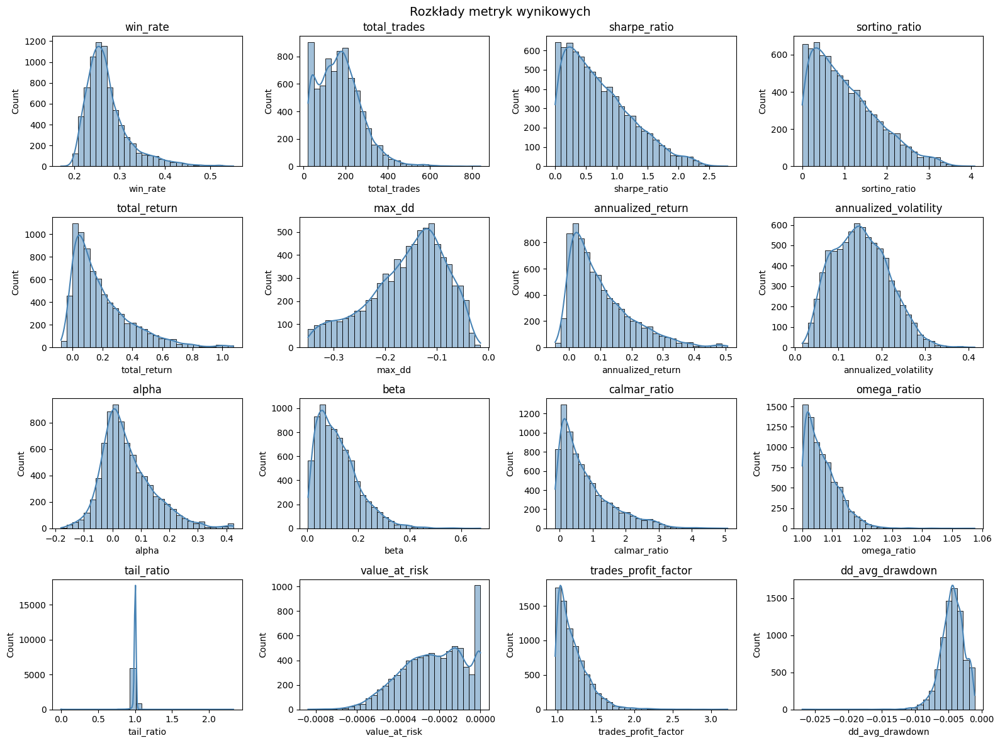

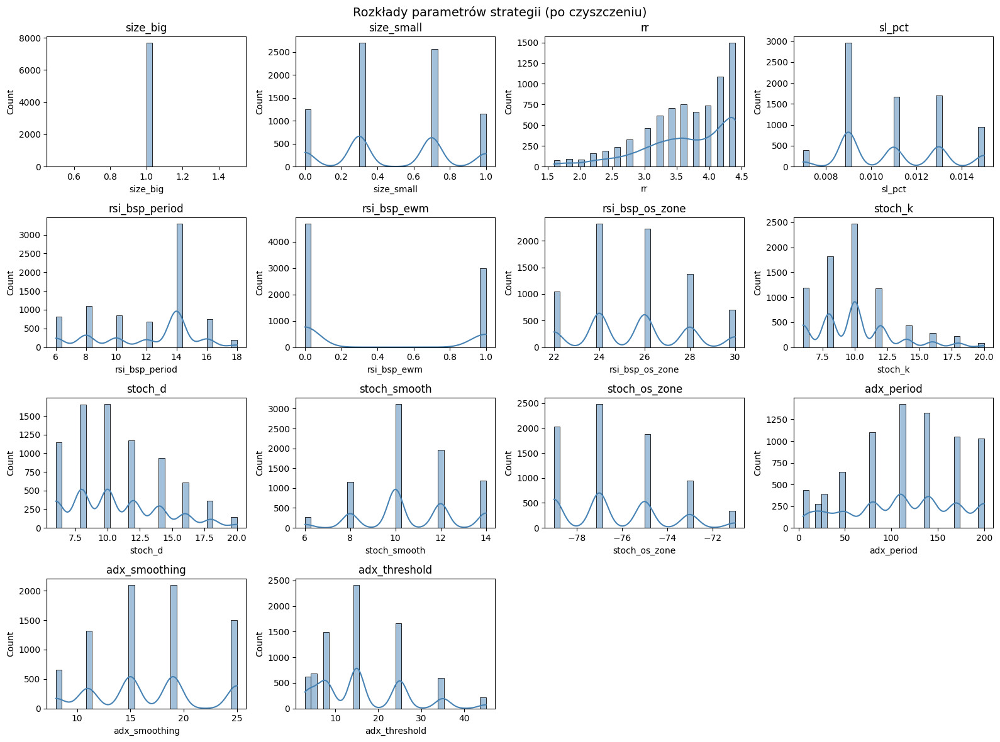

In [ ]:
# Histogramy rozkładów
def plot_histograms(data, title, bins=30):
    n_cols = 4
    n_rows = int(np.ceil(len(data.columns) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 3))
    axes = axes.flatten()
    for i, col in enumerate(data.columns):
        sns.histplot(data[col], bins=bins, kde=True, ax=axes[i], color="steelblue")
        axes[i].set_title(col)
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

plot_histograms(df_metrics, "Rozkłady metryk wynikowych")
plot_histograms(df_params, "Rozkłady parametrów strategii (po czyszczeniu)")

Nie będę opisywać każdego histogramu z osobna i podawać wartości, gdyż każdy umie to w łatwy sposób odczytać. Zazanczę na co wrto zwrócić uwagę:
-

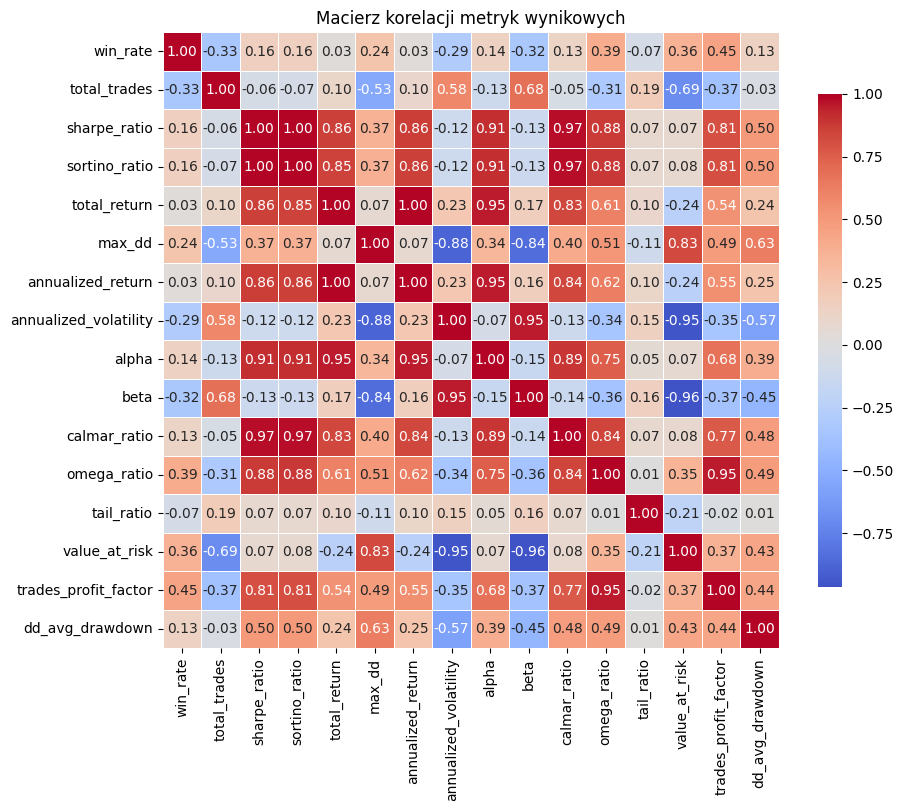

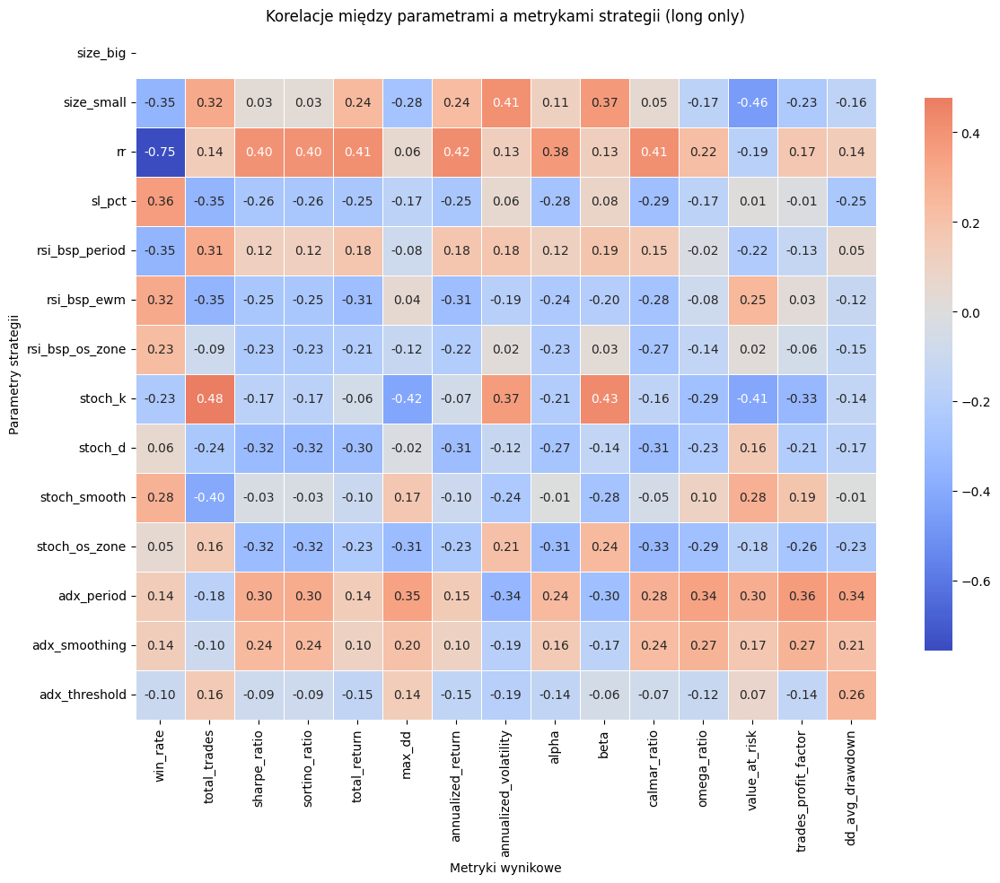

In [ ]:
# Korelacje między metrykami
metric_corr = df_metrics.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(
    metric_corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
)
plt.title("Macierz korelacji metryk")
plt.show()

# Korelacje między parametrami a metrykami
corr_params_metrics = (
    df[parameters_column_names + metric_columns]
    .corr()
    .loc[parameters_column_names, metric_columns]
)

plt.figure(figsize=(14, 10))
sns.heatmap(
    corr_params_metrics,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
)
plt.title("Korelacje między parametrami a metrykami strategii")
plt.xlabel("Metryki")
plt.ylabel("Parametry strategii")
plt.show()

In [ ]:
# macierz korelacji bezwzględnej
metric_corr_abs = metric_corr.abs()

# górny trójkąt macierzy (żeby nie dublować)
upper = metric_corr_abs.where(np.triu(np.ones(metric_corr_abs.shape), k=1).astype(bool))

# próg istotnej korelacji jaki wybieramy
threshold = 0.9

# szukamy pary o korelacji > threshold
high_corr_pairs = (
    upper.stack()  # spłaszczenie do par
    .reset_index()
    .rename(columns={"level_0": "metric_1", "level_1": "metric_2", 0: "corr"})
    .query("corr > @threshold")
    .sort_values("corr", ascending=False)
)

if high_corr_pairs.empty:
    print(f"Brak silnie skorelowanych metryk (> {threshold})")
else:
    print("Silnie skorelowane metryki (> {threshold}:")
    display(high_corr_pairs)


Silnie skorelowane metryki (> 0.9):


,metric_1,metric_2,corr
27,sharpe_ratio,sortino_ratio,0.999945
51,total_return,annualized_return,0.998982
45,sortino_ratio,calmar_ratio,0.971652
34,sharpe_ratio,calmar_ratio,0.970741
92,beta,value_at_risk,0.963253
81,annualized_volatility,value_at_risk,0.954310
78,annualized_volatility,beta,0.948634
100,omega_ratio,trades_profit_factor,0.948558
70,annualized_return,alpha,0.948537
53,total_return,alpha,0.947017


In [10]:
# # --- Na tej podstawie wybieramy reprezentatywne kolumny
# to_remove = [
#     "sharpe_ratio",          # duplikat Sortino
#     # "annualized_return",     # duplikat total_return
#     "value_at_risk",         # duplikat volatility/beta
#     "beta",                  # bardzo blisko volatility
#     "alpha"                  # mocno powiązane z annualized_return
# ]

# # Usuwamy wybrane kolumny z df i z listy metryk
# df = df.drop(columns=to_remove)
# metric_columns = [col for col in metric_columns if col not in to_remove]

# print(f"\nPozostałe metryki do MDS/PCA ({len(metric_columns)}):")
# print(metric_columns)

Analiza korelacji metryk wykazała, że niektóre wskaźniki są ze sobą silnie powiązane.
Takie zależności potwierdzają zasadność zastosowania metody PCA w dalszej części analizy, której celem jest redukcja współliniowości i identyfikacja głównych wymiarów zmienności wyników strategii.

Wyniki pokazują bardzo wyraźny **podział metryk na kilka grup silnie skorelowanych**, każda z nich opisuje inny aspekt strategii.

### Grupa 1 – Metryki efektywności / jakości zysków

| metric_1      | metric_2      | corr  |
| ------------- | ------------- | ----- |
| sharpe_ratio  | sortino_ratio | 0.999 |
| sortino_ratio | calmar_ratio  | 0.939 |
| sharpe_ratio  | calmar_ratio  | 0.934 |

**Interpretacja:**

- `Sharpe`, `Sortino` i `Calmar` mierzą stosunek zysku do ryzyka w różnej formie:
  - Sharpe uwzględnia całą zmienność,
  - Sortino tylko zmienność strat (bardziej „uczciwy”),
  - Calmar odnosi zysk do maksymalnego obsunięcia.
- Korelacje bliskie 1.0 oznaczają, że **opisują praktycznie ten sam aspekt**, czyli ogólną jakość strategii pod kątem ryzyka i zysku.
- Dla PCA oznacza to, że ta grupa zostanie zredukowana do **jednej wspólnej składowej**, np. „czynnik efektywności”.

### Grupa 2 – Metryki zyskowności

| metric_1          | metric_2          | corr  |
| ----------------- | ----------------- | ----- |
| total_return      | annualized_return | 0.996 |
| annualized_return | alpha             | 0.958 |
| total_return      | alpha             | 0.947 |

**Interpretacja:**

- Te trzy miary opisują **czysty zysk lub nadwyżkę zysku**:
  - `total_return` to zwrot ogólny,
  - `annualized_return` to ten sam, tylko w skali rocznej,
  - `alpha`to zysk powyżej rynku / benchmarku.
- Wysoka korelacja to naturalna konsekwencja ponieważ te wskaźniki **opisują praktycznie ten sam wymiar: zyskowność**.
- Dla PCA to druga główna oś np. **„czynnik zyskowności”**.

### Grupa 3 – Metryki ryzyka i ekspozycji

| metric_1              | metric_2      | corr  |
| --------------------- | ------------- | ----- |
| annualized_volatility | value_at_risk | 0.968 |
| beta                  | value_at_risk | 0.968 |
| annualized_volatility | beta          | 0.952 |

**Interpretacja:**

- Wszystkie trzy opisują **skalę ryzyka / zmienności strategii**:
  - `volatility` to zmienność ogólna,
  - `beta` to wrażliwość na rynek,
  - `value_at_risk` to ryzyko straty w określonym procencie przypadków.
- Wysoka korelacja sugeruje, że można je traktować jako **jedną grupę czynników ryzyka**.
- Dla PCA będzie to prawdopodobnie **druga lub trzecia składowa główna**, pokazująca wymiar „ryzyko”.

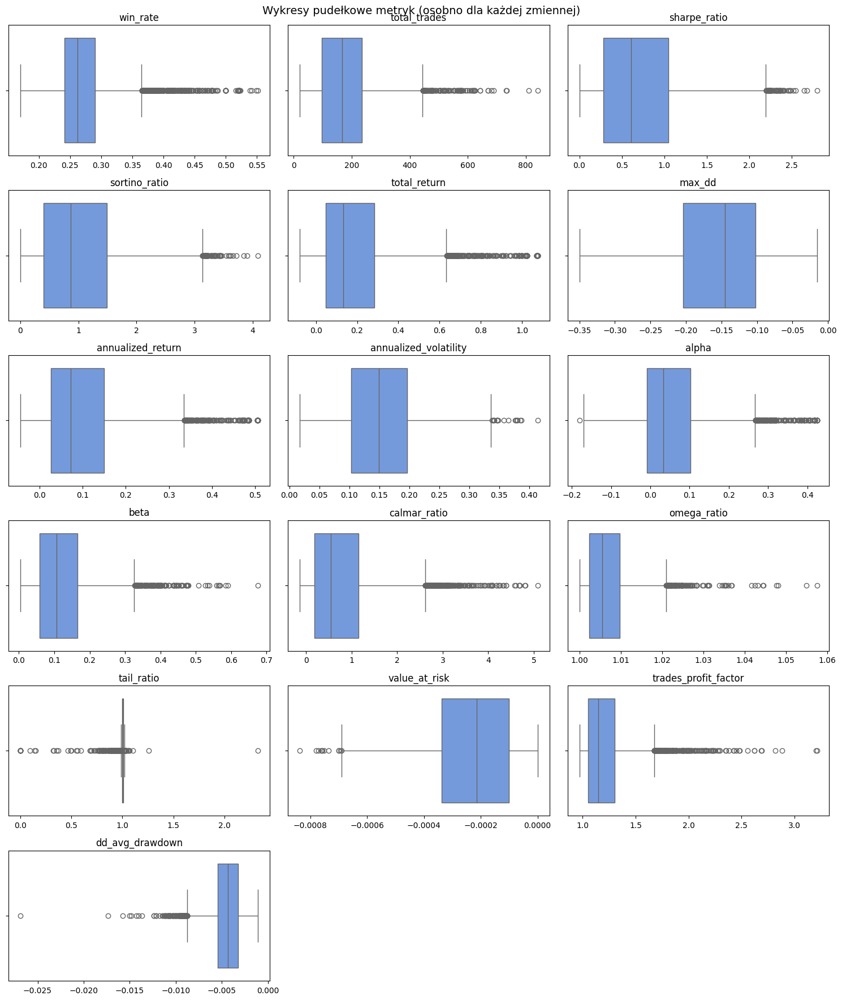

In [ ]:
# Wykresy pudełkowe (outliery)
n_cols = 3
n_rows = int(np.ceil(len(df_metrics.columns) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 3))
axes = axes.flatten()

for i, col in enumerate(df_metrics.columns):
    sns.boxplot(x=df_metrics[col], ax=axes[i], color="cornflowerblue")
    axes[i].set_title(col)
    axes[i].set_xlabel("")  # nie powtarzaj nazw
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Wykresy pudełkowe metryk (osobno dla każdej zmiennej)", fontsize=14)
plt.tight_layout()
plt.show()

Widzimy, że najwięcej outlinerów mamy dla 

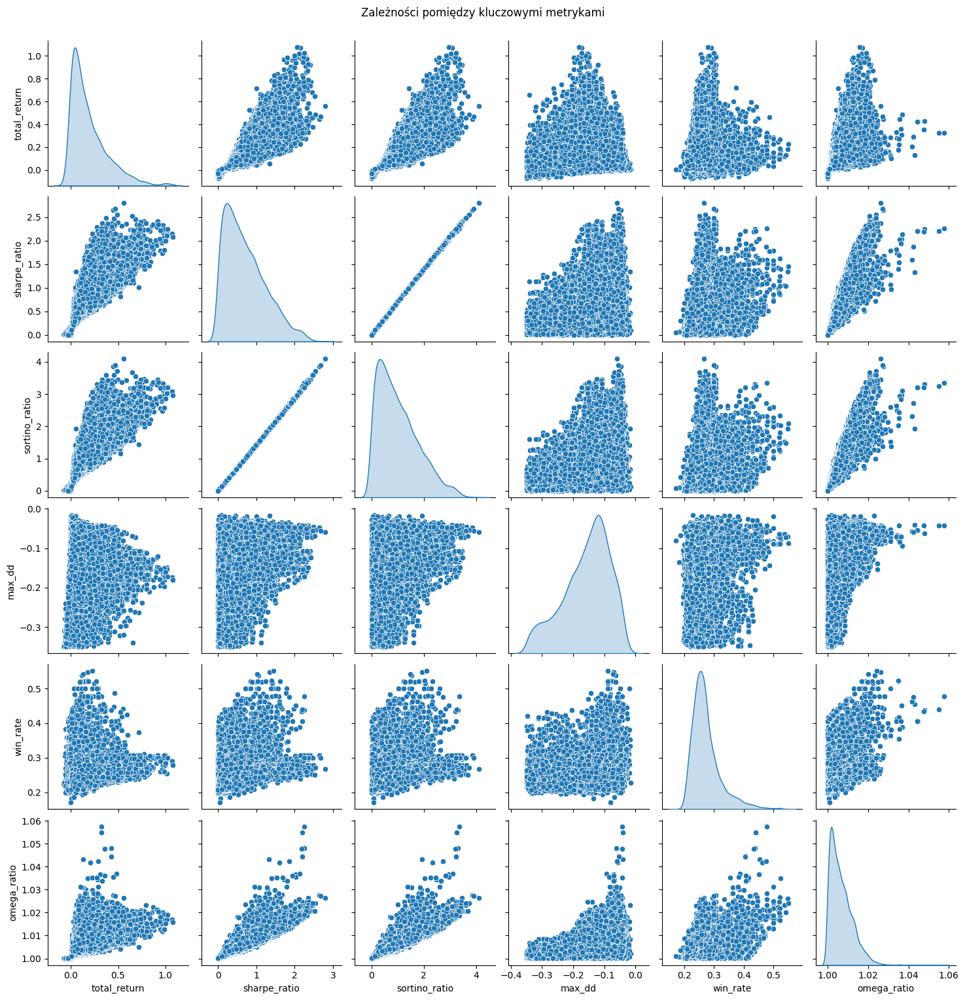

In [ ]:
# Zależności: parametry vs wyniki
sns.pairplot(df, vars=['total_return', 'sharpe_ratio', 'sortino_ratio', 'max_dd', 'win_rate', 'omega_ratio'], diag_kind='kde')
plt.suptitle("Zależności pomiędzy kluczowymi metrykami", y=1.02)
plt.show()

Ze względu na ilość danych i czas tworzenia MDS (a raczej jego brak, gdyż po 30 minutach się nie doczekałem), postanowiłem, że muszę zredukować ilość danych.
Ze wsględu na specyfikację MDS redukcja ilości danych da dużo większy wpływ niż redukcja metryk, dlatego metryki pozostają wszytskie.
Pozostawiamy tylko wyniki które dawały zyski, bądź niewielkie straty oraz ilość tranzakcji była na tyle sensowna, żeby wierzyć statystyce.

# MDS

Celem MDS jest przekształcenie danych wielowymiarowych (tu: metryk) do 2D lub 3D w taki sposób, aby zachować możliwie najlepiej odległości (podobieństwa) między punktami.

W efekcie:
- punkty położone blisko siebie reprezentują strategie o podobnych wynikach metryk,
- punkty daleko od siebie to różne jakościowo konfiguracje strategii.

---

Ze względu na ilość danych i czas tworzenia MDS (a raczej jego brak, gdyż po 30 minutach się nie doczekałem), postanowiłem, że muszę zredukować ilość danych.
Ze wsględu na specyfikację MDS redukcja ilości danych da dużo większy wpływ niż redukcja metryk, dlatego metryki pozostają wszytskie.
Pozostawiamy tylko wyniki które dawały zyski, bądź niewielkie straty oraz ilość tranzakcji była na tyle sensowna, żeby wierzyć statystyce.

In [ ]:
df_filtered_mds_1 = df[
    (df['total_trades'] > 20) &         # minimum by móc sensowne statystyki wyciągać
    (df['sharpe_ratio'] > 0.0) &        # odrzucamy ujemne sharpe
    (df['max_dd'] > -0.35) &            # unikamy całkowitych zapaści
    (df['total_return'] > -0.2)         # unikamy dużych strat
]

print(f"Liczba strategii po filtracji: {len(df_filtered_mds_1)} / {len(df)}")

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Wybór kolumn do pokazania na końcu przy wykresach
mds_show_column_names = set(important_parameters_column_names + metric_columns)

# wybór danych do MDS
X_metrics = df_filtered_mds_1[metric_columns].copy()

# standaryzacja
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_metrics)

## Klasyczne skalowanie wielowymiarowe

Metoda **Metric MDS (Classical)** dąży do odwzorowania obserwacji z przestrzeni wielowymiarowej w przestrzeń o mniejszej liczbie wymiarów (np. 2D lub 3D)
w taki sposób, aby **zachować rzeczywiste odległości między punktami** (tu: między strategiami opisanymi przez metryki).

W praktyce:

- dane standaryzujemy (żeby każda metryka miała równy wpływ),
- obliczamy **macierz odległości euklidesowej** pomiędzy wszystkimi strategiami,
- MDS znajduje pozycję punktów w 2D / 3D tak, by odwzorować te odległości z minimalnym błędem (*stress*).

Niższa wartość `stress` to lepsze odwzorowanie.

Z uwagi na wysoką złożoność obliczeniową metody MDS (O(n²–n³)), zastosowano wersję optymalizowaną poprzez ograniczenie liczby iteracji (max_iter=100) i inicjalizacji (n_init=1). Pozwala to znacząco skrócić czas obliczeń przy zachowaniu jakości odwzorowania (różnice w stress < 1%).

In [ ]:
# macierz odległości (Euklides)
dist_matrix = pairwise_distances(X_scaled, metric='euclidean')

print("Kształt macierzy odległości:", dist_matrix.shape)

Kształt macierzy odległości: (7685, 7685)


## przestrzeń 2D

In [ ]:
# Uruchomienie klasycznego MDS w 2D
mds_2d = MDS(
    n_components=2,
    dissimilarity='precomputed',
    random_state=42,
    n_init=1,
    max_iter=100,
    normalized_stress='auto'
)

X_mds_2d = mds_2d.fit_transform(dist_matrix)
df_mds_2d = pd.DataFrame(X_mds_2d, columns=['MDS1', 'MDS2'])
print(f"Stress (2D): {mds_2d.stress_:.4f}")

Stress (2D): 51545989.2489


In [ ]:
import plotly.express as px
import plotly.graph_objects as go

# Dodajemy wszystkie metryki i parametry
for m in mds_show_column_names:
    df_mds_2d[m] = df_filtered_mds_1[m].values

default_metric = 'total_return'

fig_2d = px.scatter(
    df_mds_2d,
    x='MDS1',
    y='MDS2',
    color=default_metric,
    color_continuous_scale='RdBu',
    opacity=0.8,
    title=f"Mapa podobieństw strategii (MDS 2D) — kolor: {default_metric}",
    hover_data={m: ':.3f' for m in mds_show_column_names}
)

# Menu do wyboru metryki
buttons = []
for metric in mds_show_column_names:
    cmin = df_mds_2d[metric].min()
    cmax = df_mds_2d[metric].max()
    
    buttons.append(dict(
        method='update',
        label=metric,
        args=[
            {
                'marker': {
                    'color': df_mds_2d[metric],
                    'colorscale': 'RdBu',
                    'cmin': cmin,
                    'cmax': cmax,
                    'colorbar': {'title': metric}
                }
            },
            {'title': f"Mapa podobieństw strategii (MDS 2D) — kolor: {metric}"}
        ]
    ))

fig_2d.update_layout(
    updatemenus=[dict(
        buttons=buttons,
        direction="down",
        showactive=True,
        x=1.2,
        xanchor="left",
        y=1,
        yanchor="top"
    )],
    template='plotly_dark',
    coloraxis_colorbar=dict(title="Total Return"),
    xaxis_title="Wymiar 1 (MDS1)",
    yaxis_title="Wymiar 2 (MDS2)",
    height=700
)

fig_2d.show()


## przestrzeń 3D

In [ ]:
#  Uruchomienie klasycznego MDS w 3D
mds = MDS(
    n_components=3,
    dissimilarity='precomputed',  # używamy gotowej macierzy odległości
    random_state=42,
    n_init=1,         # mniej powtórzeń
    max_iter=100,     # mniej iteracji optymalizacji
    normalized_stress='auto'
)

X_mds_3d = mds.fit_transform(dist_matrix)
df_mds_3d = pd.DataFrame(X_mds_3d, columns=['MDS1', 'MDS2', 'MDS3'])
print(f"Stress: {mds.stress_:.4f}")

Stress: 6179168.0474


In [ ]:
for m in mds_show_column_names:
    df_mds_3d[m] = df_filtered_mds_1[m].values

default_metric = 'total_return'

fig = px.scatter_3d(
    df_mds_3d,
    x='MDS1',
    y='MDS2',
    z='MDS3',
    color=default_metric,
    color_continuous_scale='RdBu',
    opacity=0.8,
    title=f"Mapa podobieństw strategii (MDS 3D) — kolor: {default_metric}",
    hover_data={m: ':.3f' for m in mds_show_column_names}
)

buttons = []
for metric in mds_show_column_names:
    cmin = df_mds_3d[metric].min()
    cmax = df_mds_3d[metric].max()

    buttons.append(dict(
        method='update',
        label=metric,
        args=[
            {
                'marker': {
                    'color': df_mds_3d[metric],
                    'colorscale': 'RdBu',
                    'cmin': cmin,
                    'cmax': cmax,
                    'colorbar': {'title': metric}
                }
            },
            {
                'title': f"Mapa podobieństw strategii (MDS 3D) — kolor: {metric}"
            }
        ]
    ))

fig.update_layout(
    updatemenus=[dict(
        buttons=buttons,
        direction="down",
        showactive=True,
        x=1.2,
        xanchor="left",
        y=1,
        yanchor="top"
    )],
    scene=dict(
        xaxis_title='Wymiar 1 (MDS1)',
        yaxis_title='Wymiar 2 (MDS2)',
        zaxis_title='Wymiar 3 (MDS3)'
    ),
    template='plotly_dark',
    height=700
)

fig.show()


## MEtoda skalowanie Sammona

Jest nieliniową odmianą MDS skupiającą się na lepszym odwzorowaniu małych odległości (lokalnej struktury).

**Czym się różni Sammon od MDS**
- klasyczny MDS minimalizuje błąd globalny odwzorowania (całej macierzy odległości),
- Sammon kładzie większy nacisk na lokalne relacje czyli punkty, które były blisko w oryginale, pozostają blisko również po redukcji.

Dzięki temu Sammon często pokazuje bardziej „rozciągnięte” klastry i pozwala lepiej widzieć lokalne skupienia strategii.

---
Znów ze względu na czasowość, muszę przyciąć znóe odrobinę dane

In [69]:
df_filtered_mds_2 = df[
    (df['total_trades'] > 20) &         # minimum by móc sensowne statystyki wyciągać
    (df['sharpe_ratio'] > 0.5) &        # odrzucamy ujemne sharpe
    (df['max_dd'] > -0.15) &            # unikamy całkowitych zapaści
    (df['total_return'] > 0.2)         # unikamy dużych strat
]

print(f"Liczba strategii po filtracji: {len(df_filtered_mds_2)} / {len(df)}")

Liczba strategii po filtracji: 1470 / 7685


In [75]:
from sammon import sammon
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import pandas as pd

scaler = StandardScaler()
X_scaled_mds_2 = scaler.fit_transform(df_filtered_mds_2[metric_columns])

In [ ]:
# Skalowanie Sammona (2D)
Y_2d, stress_2d = sammon.sammon(
    X_scaled_mds_2,
    n=2,
    display=1,
    inputdist='raw',
    maxiter=200,
    tolfun=1e-9,
)

print(f"Sammon stress (2D): {stress_2d:.6f}")
df_sammon_2d = pd.DataFrame(Y_2d, columns=['S1', 'S2'])

In [72]:
for m in mds_show_column_names:
    df_sammon_2d[m] = df_filtered_mds_2[m].values


default_metric = 'total_return'
fig_2d = px.scatter(
    df_sammon_2d,
    x='S1',
    y='S2',
    color=default_metric,
    color_continuous_scale='RdBu',
    opacity=0.8,
    title=f"Skalowanie Sammona (2D) — kolor: {default_metric}",
    hover_data={m: ':.3f' for m in mds_show_column_names}
)

buttons_2d = []
for metric in mds_show_column_names:
    cmin = df_sammon_2d[metric].min()
    cmax = df_sammon_2d[metric].max()
    buttons_2d.append(dict(
        method='update',
        label=metric,
        args=[
            {'marker': {
                'color': df_sammon_2d[metric],
                'colorscale': 'RdBu',
                'cmin': cmin,
                'cmax': cmax,
                'colorbar': {'title': metric}
            }},
            {'title': f"Skalowanie Sammona (2D) — kolor: {metric}"}
        ]
    ))

fig_2d.update_layout(
    updatemenus=[dict(
        buttons=buttons_2d,
        direction="down",
        showactive=True,
        x=1.2,
        y=1,
        xanchor="left",
        yanchor="top"
    )],
    template='plotly_dark',
    height=700
)
fig_2d.show()

# PCA

Analiza głównych składowych (PCA) to technika redukcji wymiarów polegająca na przekształceniu oryginalnych zmiennych w nowe, niepowiązane ze sobą komponenty (składowe główne), które zachowują jak największą część wariancji danych.
W przeciwieństwie do metod takich jak MDS czy Skalowanie Sammona, PCA opiera się na transformacji liniowej i jest znacznie szybsze obliczeniowo.
Celem jest zidentyfikowanie najważniejszych kierunków zmienności w danych, co pozwala na wizualne grupowanie podobnych strategii tradingowych i ocenę relacji między parametrami strategii a wynikami (np. total_return, sharpe_ratio).

In [81]:
from sklearn.decomposition import PCA

scaler = StandardScaler()
X_scaled_pca = scaler.fit_transform(df[metric_columns])

# PCA 2D
pca_2d = PCA(n_components=2, random_state=42)
X_pca_2d = pca_2d.fit_transform(X_scaled_pca)

explained_2d = pca_2d.explained_variance_ratio_.sum()
print(f"Wyjaśniona wariancja (2D): {explained_2d*100:.2f}%")

Wyjaśniona wariancja (2D): 80.47%


In [85]:
print(pd.DataFrame({
    'Składowa': ['PC1', 'PC2'],
    'Wariancja [%]': pca_2d.explained_variance_ratio_ * 100
}))

  Składowa  Wariancja [%]
0    PC1      50.502905  
1    PC2      29.964735  


In [82]:
df_pca_2d = pd.DataFrame(X_pca_2d, columns=['PC1', 'PC2'])
for m in mds_show_column_names:
    df_pca_2d[m] = df[m].values

# Wizualizacja PCA 2D
default_metric = 'total_return'
fig_pca_2d = px.scatter(
    df_pca_2d,
    x='PC1',
    y='PC2',
    color=default_metric,
    color_continuous_scale='RdBu',
    opacity=0.8,
    title=f"PCA (2D) — kolor: {default_metric}",
    hover_data={m: ':.3f' for m in mds_show_column_names}
)

buttons_2d = []
for metric in mds_show_column_names:
    cmin = df_pca_2d[metric].min()
    cmax = df_pca_2d[metric].max()
    buttons_2d.append(dict(
        method='update',
        label=metric,
        args=[
            {'marker': {
                'color': df_pca_2d[metric],
                'colorscale': 'RdBu',
                'cmin': cmin,
                'cmax': cmax,
                'colorbar': {'title': metric}
            }},
            {'title': f"PCA (2D) — kolor: {metric}"}
        ]
    ))

fig_pca_2d.update_layout(
    updatemenus=[dict(
        buttons=buttons_2d,
        direction="down",
        showactive=True,
        x=1.2,
        y=1,
        xanchor="left",
        yanchor="top"
    )],
    template='plotly_dark',
    height=700
)
fig_pca_2d.show()

In [83]:
# --- 4️⃣ PCA 3D
pca_3d = PCA(n_components=3, random_state=42)
X_pca_3d = pca_3d.fit_transform(X_scaled_pca)

explained_3d = pca_3d.explained_variance_ratio_.sum()
print(f"Wyjaśniona wariancja (3D): {explained_3d*100:.2f}%")

df_pca_3d = pd.DataFrame(X_pca_3d, columns=['PC1', 'PC2', 'PC3'])
for m in mds_show_column_names:
    df_pca_3d[m] = df[m].values

# --- 5️⃣ Wizualizacja PCA 3D
fig_pca_3d = px.scatter_3d(
    df_pca_3d,
    x='PC1',
    y='PC2',
    z='PC3',
    color=default_metric,
    color_continuous_scale='RdBu',
    opacity=0.8,
    title=f"PCA (3D) — kolor: {default_metric}",
    hover_data={m: ':.3f' for m in mds_show_column_names}
)

buttons_3d = []
for metric in mds_show_column_names:
    cmin = df_pca_3d[metric].min()
    cmax = df_pca_3d[metric].max()
    buttons_3d.append(dict(
        method='update',
        label=metric,
        args=[
            {'marker': {
                'color': df_pca_3d[metric],
                'colorscale': 'RdBu',
                'cmin': cmin,
                'cmax': cmax,
                'colorbar': {'title': metric}
            }},
            {'title': f"PCA (3D) — kolor: {metric}"}
        ]
    ))

fig_pca_3d.update_layout(
    updatemenus=[dict(
        buttons=buttons_3d,
        direction="down",
        showactive=True,
        x=1.2,
        y=1,
        xanchor="left",
        yanchor="top"
    )],
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    ),
    template='plotly_dark',
    height=700
)
fig_pca_3d.show()

Wyjaśniona wariancja (3D): 88.04%


In [84]:
print(pd.DataFrame({
    'Składowa': ['PC1', 'PC2', 'PC3'],
    'Wariancja [%]': pca_3d.explained_variance_ratio_ * 100
}))

  Składowa  Wariancja [%]
0    PC1      50.502905  
1    PC2      29.964735  
2    PC3       7.574905  
